C:\Users\RST\Desktop\Minor project\test_venv\lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/20
4468/4468 ━━━━━━━━━━━━━━━━━━━━ 198s 44ms/step - loss: 8.8853e-04
Epoch 2/20
4468/4468 ━━━━━━━━━━━━━━━━━━━━ 161s 36ms/step - loss: 1.3849e-05
Epoch 3/20
4468/4468 ━━━━━━━━━━━━━━━━━━━━ 177s 40ms/step - loss: 1.1060e-05
Epoch 4/20
4468/4468 ━━━━━━━━━━━━━━━━━━━━ 199s 44ms/step - loss: 9.0707e-06
Epoch 5/20
4468/4468 ━━━━━━━━━━━━━━━━━━━━ 193s 43ms/step - loss: 7.7315e-06
Epoch 6/20
4468/4468 ━━━━━━━━━━━━━━━━━━━━ 193s 43ms/step - loss: 7.9032e-06
Epoch 7/20
4468/4468 ━━━━━━━━━━━━━━━━━━━━ 166s 37ms/step - loss: 7.9686e-06
Epoch 8/20
4468/4468 ━━━━━━━━━━━━━━━━━━━━ 159s 36ms/step - loss: 7.5711e-06
Epoch 9/20
4468/4468 ━━━━━━━━━━━━━━━━━━━━ 164s 37ms/step - loss: 7.1433e-06
Epoch 10/20
4468/4468 ━━━━━━━━━━━━━━━━━━━━ 161s 36ms/step - loss: 7.2275e-06
Epoch 11/20
4468/4468 ━━━━━━━━━━━━━━━━━━━━ 153s 34ms/step - loss: 7.3296e-06
Epoch 12/20
4468/4468 ━━━━━━━━━━━━━━━━━━━━ 147s 33ms/step - loss: 6.9790e-06
Epoch 13/20
4468/4468 ━━━━━━━━━━━━━━━━━━━━ 146s 33ms/step - loss: 6.9047e-06
Epoch 14

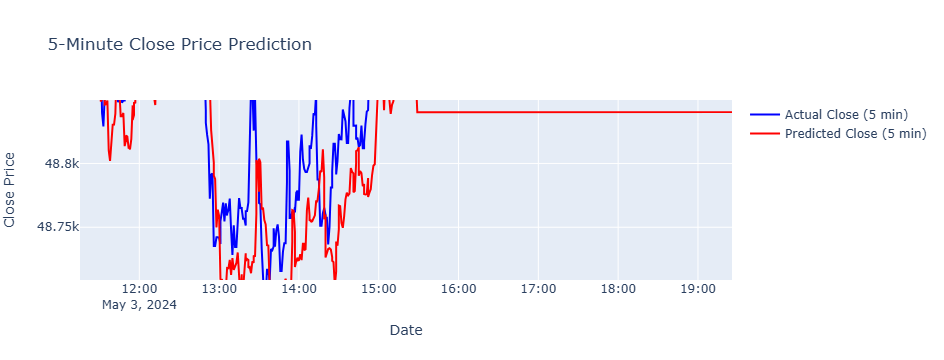

ValueError: Invalid filepath extension for saving. Please add either a `.keras` extension for the native Keras format (recommended) or a `.h5` extension. Use `model.export(filepath)` if you want to export a SavedModel for use with TFLite/TFServing/etc. Received: filepath=saved_model/model_5min.

In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.model_selection import train_test_split
import plotly.graph_objects as go

# Load the dataset
df = pd.read_csv("C:\\Users\\RST\\Desktop\\Minor project\\combined_final1.csv")

# Convert the 'Date' column to datetime and sort by date
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values('Date')

# Create target columns (shifting Close price to predict the future)
df['target_5min'] = df['Close'].shift(-5)  # Predict Close 5 minutes into the future
df['target_10min'] = df['Close'].shift(-10)  # Predict 10 minutes into the future
df['target_15min'] = df['Close'].shift(-15)  # Predict 15 minutes into the future

# Drop rows with NaN target values (because of the shift)
df = df.dropna()

# Select features for the model
features = ['Open', 'High', 'Low', 'Close']

# Initialize a MinMaxScaler for both features and target
scaler_features = MinMaxScaler(feature_range=(0, 1))
scaler_target = MinMaxScaler(feature_range=(0, 1))

# Normalize features and target
scaled_features = scaler_features.fit_transform(df[features])
scaled_target_5min = scaler_target.fit_transform(df['target_5min'].values.reshape(-1, 1))
scaled_target_10min = scaler_target.fit_transform(df['target_10min'].values.reshape(-1, 1))
scaled_target_15min = scaler_target.fit_transform(df['target_15min'].values.reshape(-1, 1))

# Define a function to create time series data
def create_sequences(data, target, window_size):
    X = []
    y = []
    for i in range(window_size, len(data)):
        X.append(data[i - window_size:i])  # Append the previous 'window_size' data points
        y.append(target[i])  # Append the corresponding target value
    return np.array(X), np.array(y)

# Parameters
window_size = 60  # Use last 60 data points (minutes) to predict the future

# Create sequences for each prediction horizon
X, y_5min = create_sequences(scaled_features, scaled_target_5min, window_size)
_, y_10min = create_sequences(scaled_features, scaled_target_10min, window_size)
_, y_15min = create_sequences(scaled_features, scaled_target_15min, window_size)

# Split the data into training and testing sets
X_train, X_test, y_train_5min, y_test_5min = train_test_split(X, y_5min, test_size=0.2, shuffle=False)
_, _, y_train_10min, y_test_10min = train_test_split(X, y_10min, test_size=0.2, shuffle=False)
_, _, y_train_15min, y_test_15min = train_test_split(X, y_15min, test_size=0.2, shuffle=False)

# Create an LSTM model
def create_model():
    model = Sequential()
    model.add(LSTM(units=100, return_sequences=True, input_shape=(window_size, len(features))))
    model.add(LSTM(units=100))
    model.add(Dense(1))  # Output layer for one feature (predicted Close price)
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

# Train the models
model_5min = create_model()
model_10min = create_model()
model_15min = create_model()

model_5min.fit(X_train, y_train_5min, epochs=20, batch_size=64)
model_10min.fit(X_train, y_train_10min, epochs=20, batch_size=64)
model_15min.fit(X_train, y_train_15min, epochs=20, batch_size=64)

# Predict on the test data
predictions_5min = model_5min.predict(X_test)
predictions_10min = model_10min.predict(X_test)
predictions_15min = model_15min.predict(X_test)

# Inverse scaling to match original values
predictions_5min_rescaled = scaler_target.inverse_transform(predictions_5min)
y_test_5min_rescaled = scaler_target.inverse_transform(y_test_5min)

predictions_10min_rescaled = scaler_target.inverse_transform(predictions_10min)
y_test_10min_rescaled = scaler_target.inverse_transform(y_test_10min)

predictions_15min_rescaled = scaler_target.inverse_transform(predictions_15min)
y_test_15min_rescaled = scaler_target.inverse_transform(y_test_15min)

# Plot the results using Plotly for 5-minute prediction
fig = go.Figure()

# Add actual and predicted traces for 5-min predictions
fig.add_trace(go.Scatter(x=df['Date'].iloc[-len(y_test_5min_rescaled):], y=y_test_5min_rescaled.flatten(),
                         mode='lines', name='Actual Close (5 min)', line=dict(color='blue')))
fig.add_trace(go.Scatter(x=df['Date'].iloc[-len(predictions_5min_rescaled):], y=predictions_5min_rescaled.flatten(),
                         mode='lines', name='Predicted Close (5 min)', line=dict(color='red')))

# Customize layout
fig.update_layout(
    title='5-Minute Close Price Prediction',
    xaxis_title='Date',
    yaxis_title='Close Price',
    hovermode='x unified'
)

# Show interactive plot
fig.show()

# Repeat this plot for 10-min and 15-min predictions as needed

# Save as TensorFlow SavedModel
model_5min.save('saved_model/model_5min')
model_10min.save('saved_model/model_10min')
model_15min.save('saved_model/model_15min')


In [2]:
model_5min.save('saved_model/model_5min.h')
model_10min.save('saved_model/model_10min.h')
model_15min.save('saved_model/model_15min.h')


ValueError: Invalid filepath extension for saving. Please add either a `.keras` extension for the native Keras format (recommended) or a `.h5` extension. Use `model.export(filepath)` if you want to export a SavedModel for use with TFLite/TFServing/etc. Received: filepath=saved_model/model_5min.h.

In [3]:
model_5min.save('model_5min.h5')
model_10min.save('model_10min.h5')
model_15min.save('model_15min.h5')


In [6]:
predicted_values_5min = predictions_5min_rescaled.flatten()
actual_values_5min = y_test_5min_rescaled.flatten()

In [7]:
np.savetxt("predicted_5min.csv", predicted_values_5min, delimiter=",")
np.savetxt("actual_5min.csv", actual_values_5min, delimiter=",")

In [9]:
import pandas as pd
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Load actual and predicted values
actual = pd.read_csv('actual_5min.csv')  # Replace this with the correct path
predicted = pd.read_csv('predicted_5min.csv')

# Ensure both series are the same length and aligned
actual_values = actual['Close'].values
predicted_values = predicted['Close'].values

# Mean Absolute Error (MAE)
mae = mean_absolute_error(actual_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(actual_values, predicted_values)

# Root Mean Squared Error (RMSE)
rmse = mean_squared_error(actual_values, predicted_values, squared=False)

# R² Score (Coefficient of Determination)
r2 = r2_score(actual_values, predicted_values)

# Display the results
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R² Score: {r2}")

Mean Absolute Error (MAE): 67.60496383452019
Mean Squared Error (MSE): 10094.71578269933
Root Mean Squared Error (RMSE): 100.47246280797206
R² Score: 0.9978749999824958


C:\Users\RST\Desktop\Minor project\test_venv\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



In [10]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

# Create direction labels (1 for up, 0 for down)
actual_direction = (actual_values[1:] > actual_values[:-1]).astype(int)  # 1: Price went up, 0: Price went down
predicted_direction = (predicted_values[1:] > predicted_values[:-1]).astype(int)

# Calculate confusion matrix and classification report
conf_matrix = confusion_matrix(actual_direction, predicted_direction)
class_report = classification_report(actual_direction, predicted_direction)
accuracy = accuracy_score(actual_direction, predicted_direction)

# Display the classification metrics
print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)
print(f"Accuracy: {accuracy}")


Confusion Matrix:
[[62568  3903]
 [ 4626   379]]

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.94      0.94     66471
           1       0.09      0.08      0.08      5005

    accuracy                           0.88     71476
   macro avg       0.51      0.51      0.51     71476
weighted avg       0.87      0.88      0.88     71476

Accuracy: 0.8806732329733057
